<a href="https://colab.research.google.com/github/MoAbeds/sign-language-Yolo5/blob/main/Sign_Lang_YOLOv5_Custom_Training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Step 1: Install Requirements

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 9993, done.
remote: Total 9993 (delta 0), reused 0 (delta 0), pack-reused 9993
Receiving objects: 100% (9993/9993), 10.32 MiB | 3.04 MiB/s, done.
Resolving deltas: 100% (6928/6928), done.
/content/yolov5
     |████████████████████████████████| 596 kB 4.1 MB/s 
     |████████████████████████████████| 145 kB 4.1 MB/s 
     |████████████████████████████████| 178 kB 45.4 MB/s 
     |████████████████████████████████| 1.1 MB 22.4 MB/s 
     |████████████████████████████████| 67 kB 5.3 MB/s 
     |████████████████████████████████| 138 kB 52.7 MB/s 
     |████████████████████████████████| 62 kB 597 kB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 

#Download Dataset from RoboFlow 
replace key with your own

In [ ]:
!curl -L 'https://public.roboflow.com/ds/uyTgQ9P4WX?key={'key'}' > Dataset.zip
!mkdir Data
!unzip Dataset

# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [ ]:
!python train.py --img 416 --batch 64 --epochs 150 --data ./Data/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=./data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=150, batch_size=64, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-100-g5185981 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, translate=0.1, scale=0.5, shea

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
!python detect.py --weights ./best.pt --img 640 --conf 0.1 --source ./Data/test/images

detect: weights=['./best.pt'], source=./download.jpeg, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-100-g5185981 torch 1.10.0+cu111 CPU

Fusing layers... 
Model Summary: 213 layers, 7080247 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/download.jpeg: 640x640 1 R, Done. (0.464s)
Speed: 7.4ms pre-process, 463.8ms inference, 2.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp5


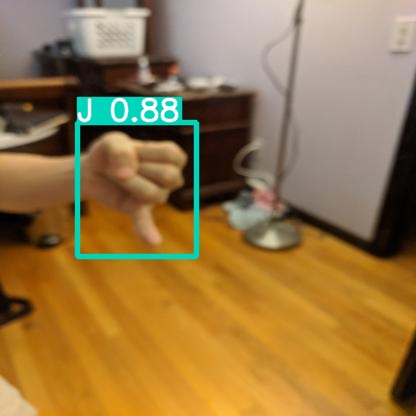

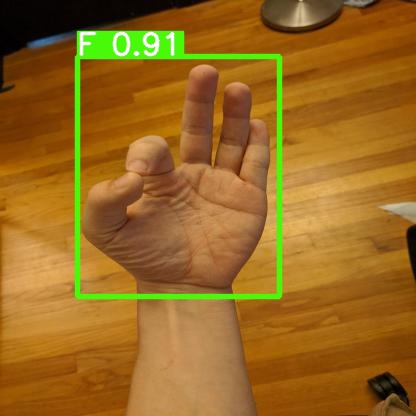

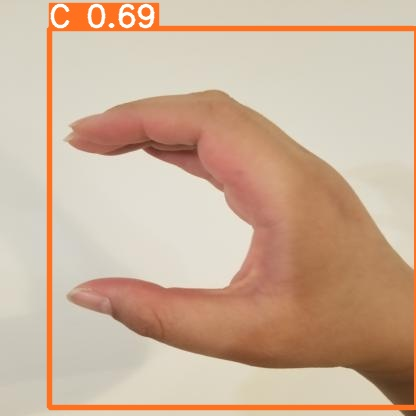

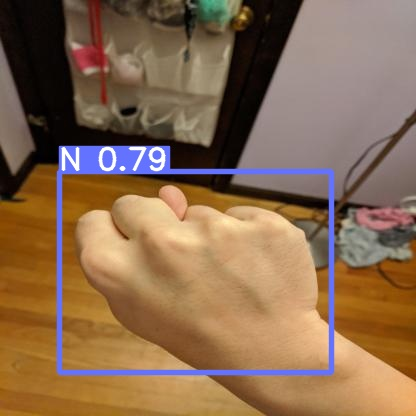

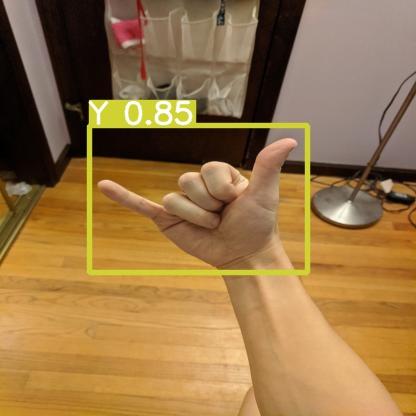

...

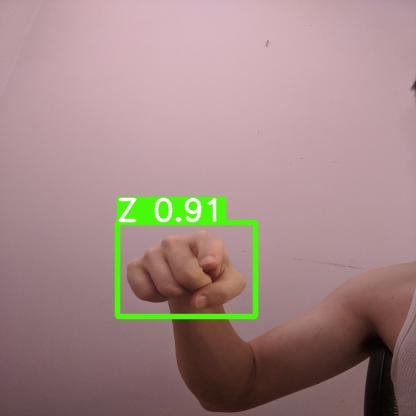

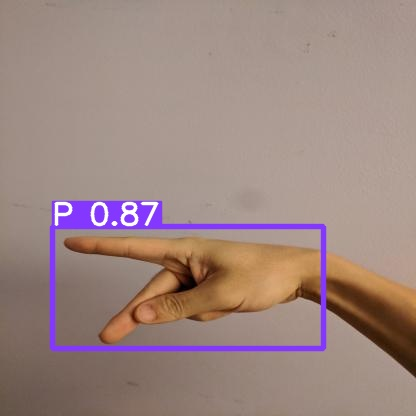

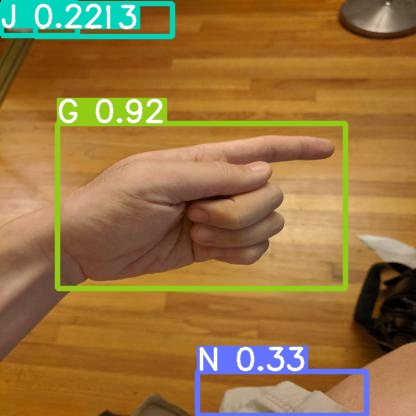

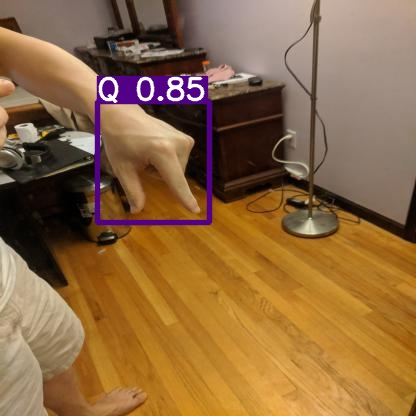

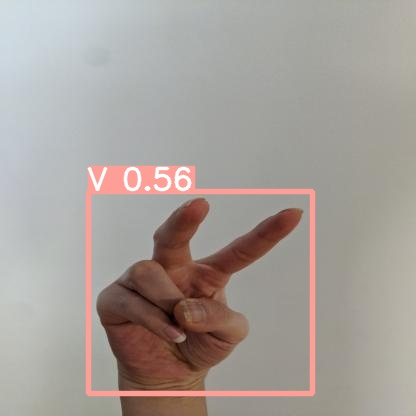

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# **Create Zip file with your weights to use it anytime**

In [ ]:
import shutil

In [ ]:
shutil.make_archive('/content/yolov5/runs/train/exp11', 'zip', '/content/yolov5/runs/train/exp11')


'/content/yolov5/runs/train/exp11.zip'

In [ ]:
!python export.py --weights ./runs/train/exp/weights/best.pt --img 640  --include onnx --dynamic

export: data=data/coco128.yaml, weights=/content/test/weights/best.pt, imgsz=[640], batch_size=1, device=cpu, half=False, inplace=False, train=False, optimize=False, int8=False, dynamic=True, simplify=False, opset=13, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['onnx']
YOLOv5 🚀 v6.0-39-g5d4258f torch 1.9.0+cu111 CPU

Fusing layers... 
Model Summary: 213 layers, 7269037 parameters, 0 gradients, 16.6 GFLOPs

PyTorch: starting from /content/test/weights/best.pt (14.8 MB)

ONNX: starting export with onnx 1.10.2...
/content/yolov5/models/yolo.py:60: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if self.grid[i].shape[2:4] != x[i].shape[2:4] or self.onnx_dynamic:
ONNX: export success, saved as /content/test/weights/best.onnx (29.1 MB)
ONNX: run